# <p style="background-color:green;font-family:newtimeroman;font-size:100%;color:white;text-align:center;border-radius:20px 20px;"><b>Adult Income Prediction Project Solution</b></p>
![](https://www.techproeducation.com/logo/headerlogo.svg)

# <font color='green'> <b>Exploratory Data Analysis</b><font color='black'>

### Data Set Information:
This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.

**Attribute Information:**

- **Age**: Describes the age of individuals. Continuous.
**Workclass**: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

- **fnlwgt**: Continuous value. This is a weighting factor created by the U.S. Census Bureau, representing the number of people each data entry corresponds to. 
For example, if the fnlwgt value for a data entry is 100, it means that this data entry represents 100 individuals.

- **education**: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

- **education-num**: Number of years spent in education. Continuous.

- **marital-status**: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

- **occupation**: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- **relationship**: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

- **race**: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

- **sex**: Female, Male.

- **capital-gain**: Bir bireyin varlık satışlarından (örneğin, hisse senedi veya gayrimenkul satışı) elde ettiği kazancı temsil eder. Continuous.

- **capital-loss**: Bir bireyin varlık satışlarından (örneğin, hisse senedi veya gayrimenkul satışı) uğradığı zararı temsil eder. Continuous.

- **hours-per-week**: Continuous.

- **native-country**: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

- **salary**: >50K,<=50K.

In [257]:
# Importing libraries
import pandas as pd      
import numpy as np 
import matplotlib.pyplot as plt

%matplotlib inline

import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, roc_auc_score, auc, roc_curve, average_precision_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from yellowbrick.classifier import ROCAUC, PrecisionRecallCurve 
from sklearn.pipeline import Pipeline
from skimpy import skim
import missingno as msno
import plotly
import plotly.express as px
import cufflinks as cf   # !pip install cufflinks

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

import warnings
warnings.filterwarnings('ignore')


plt.rcParams["figure.figsize"] = (10,6)   # default: (6.4, 4.8)
pd.set_option('display.max_columns', 500) # default: 20
pd.options.display.float_format = '{:.3f}'.format

In [127]:
# Loading dataset
df0 = pd.read_csv("adult.csv")
df = df0.copy()

In [128]:
# Display the first 5 rows of the DataFrame
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [129]:
# Generate a quick summary of the dataset, providing an overview of each column
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 32561  │ │ string      │ 9     │                                                          │
│ │ Number of columns │ 15     │ │ int32       │ 6     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name      ┃ NA  ┃ NA %  ┃ mean    ┃ sd      ┃ p0     ┃ p25     ┃ p50    ┃ p75    ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ age              │   0 │     0 │   38.58 │   13.64 │     17 │      28 │     37 │     48 │      90 │ ▇▇▆▃▁  │  │
│ │ fnlwgt           │   0 │     0 │  189800 │  105500 │  12280 │  117800 │ 178400 │ 237100 │ 1485000 │   ▇▂   │  │
│ │ education.num    │   0 │     0 │   10.08 │   2.573 │      1 │       9 │     10 │     12 │      16 │  ▁▁▇▃▁ │  │
│ │ capital.gain     │   0 │     0 │    1078 │    7385 │      0 │       0 │      0 │      0 │  100000 │   ▇    │  │
│ │ capital.loss     │   0 │     0 │    87.3 │     403 │      0 │       0 │      0 │      0 │    4356 │   ▇    │  │
│ │ hours.per.week   │   0 │     0 │   40.44 │   12.35 │      1 │      40 │     40 │     45 │      99 │  ▁▂▇▂  │  │
│ └──────────────────┴─────┴───────┴─────────┴─────────┴────────┴─────────┴────────┴────────┴─────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                   ┃ NA     ┃ NA %       ┃ words per row               ┃ total words            ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ workclass                     │      0 │          0 │                           1 │                  32561 │  │
│ │ education                     │      0 │          0 │                           1 │                  32561 │  │
│ │ marital.status                │      0 │          0 │                           1 │                  32561 │  │
│ │ occupation                    │      0 │          0 │                           1 │                  32561 │  │
│ │ relationship                  │      0 │          0 │                           1 │                  32561 │  │
│ │ race                          │      0 │          0 │                           1 │                  32561 │  │
│ │ sex                           │      0 │          0 │                           1 │                  32561 │  │
│ │ native.country                │      0 │          0 │                           1 │                  32561 │  │
│ │ income                        │      0 │          0 │                           1 │                  32561 │  │
│ └───────────────────────────────┴────────┴────────────┴─────────────────────────────┴────────────────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

In [130]:
# Provides a concise summary of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [131]:
# Generates descriptive statistics of numerical columns and transposes the result
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32561.000,38.582,13.640,17.000,28.000,37.000,48.000,90.000
fnlwgt,32561.000,189778.367,105549.978,12285.000,117827.000,178356.000,237051.000,1484705.000
education.num,32561.000,10.081,2.573,1.000,9.000,10.000,12.000,16.000
capital.gain,32561.000,1077.649,7385.292,0.000,0.000,0.000,0.000,99999.000
capital.loss,32561.000,87.304,402.960,0.000,0.000,0.000,0.000,4356.000
hours.per.week,32561.000,40.437,12.347,1.000,40.000,40.000,45.000,99.000


In [132]:
df.describe(include="object").T

,count,unique,top,freq
workclass,32561,9,Private,22696
education,32561,16,HS-grad,10501
marital.status,32561,7,Married-civ-spouse,14976
occupation,32561,15,Prof-specialty,4140
relationship,32561,6,Husband,13193
race,32561,5,White,27816
sex,32561,2,Male,21790
native.country,32561,42,United-States,29170
income,32561,2,<=50K,24720


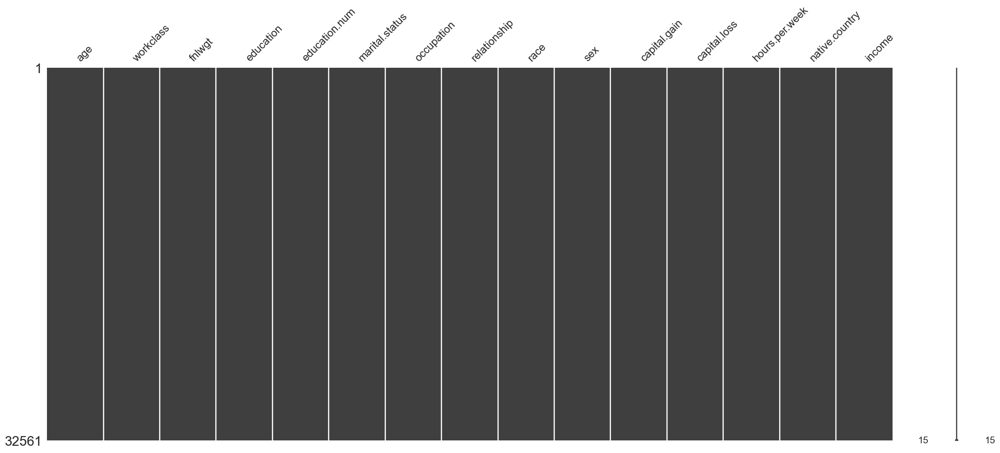

In [133]:
# Visualizes the missing values in the DataFrame using a missing value matrix from the missingno library.
msno.matrix(df);

In [134]:
df.shape

(32561, 15)

In [135]:
df.duplicated().sum()

24

In [136]:
# Removes duplicate rows from the DataFrame.
df.drop_duplicates(inplace=True)

In [137]:
df.columns


Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

In [138]:
df.sample(15)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
19750,25,Private,114838,Prof-school,15,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,8,Italy,<=50K
19347,26,Private,169727,HS-grad,9,Married-civ-spouse,Tech-support,Husband,White,Male,0,0,40,United-States,<=50K
28023,30,Private,295010,HS-grad,9,Never-married,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K
19845,19,Private,172582,Some-college,10,Never-married,Sales,Own-child,White,Male,0,0,30,United-States,<=50K
32518,46,Private,42972,Masters,14,Married-civ-spouse,Prof-specialty,Wife,White,Female,0,0,22,United-States,>50K
26503,52,Private,153751,9th,5,Separated,Other-service,Not-in-family,Black,Female,0,0,30,United-States,<=50K
21405,40,Federal-gov,199303,Assoc-acdm,12,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,>50K
23079,39,Private,186183,Masters,14,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,>50K
15462,25,Private,143280,10th,6,Never-married,Priv-house-serv,Own-child,White,Female,0,0,24,United-States,<=50K
30749,34,Local-gov,35683,Assoc-acdm,12,Divorced,Adm-clerical,Unmarried,White,Female,0,0,10,United-States,<=50K


**I notice that some feature values in my dataset are marked with a `?`. To handle this, I first examine the unique values of these features to determine how to proceed with them.**

In [139]:
df.isin(['?']).sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education.num        0
marital.status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital.gain         0
capital.loss         0
hours.per.week       0
native.country     582
income               0
dtype: int64

**Since this dataset is a education dataset, I decide to drop the rows containing `?`. However, in real-world data, I could fill these missing values with the mode of the respective features.**


In [140]:
# Replace '?' with NaN
df.replace('?', np.nan, inplace=True)

# Drop rows with NaN values
df.dropna(inplace=True)

In [141]:
df.shape

(30139, 15)

In [142]:
# Check 'education' & 'educational-num' columns

df['education'].unique()

array(['HS-grad', '7th-8th', 'Some-college', '10th', 'Doctorate',
       'Prof-school', 'Bachelors', 'Masters', '11th', 'Assoc-voc',
       '1st-4th', '5th-6th', 'Assoc-acdm', '12th', '9th', 'Preschool'],
      dtype=object)

In [143]:
df['education.num'].unique()

array([ 9,  4, 10,  6, 16, 15, 13, 14,  7, 11,  2,  3, 12,  8,  5,  1],
      dtype=int64)

'education' & 'educational-num' both columns have similer values.
'education' has string values
'educational-num' has numerical values
All HS-grad from education represents 9 in education-num
All Masters from education represents 14 in education-num and likewise.
Both columns conveying same information. So, we can remove 'education-num'
columN.

In [144]:
df.drop(['education.num'], axis=1, inplace=True)

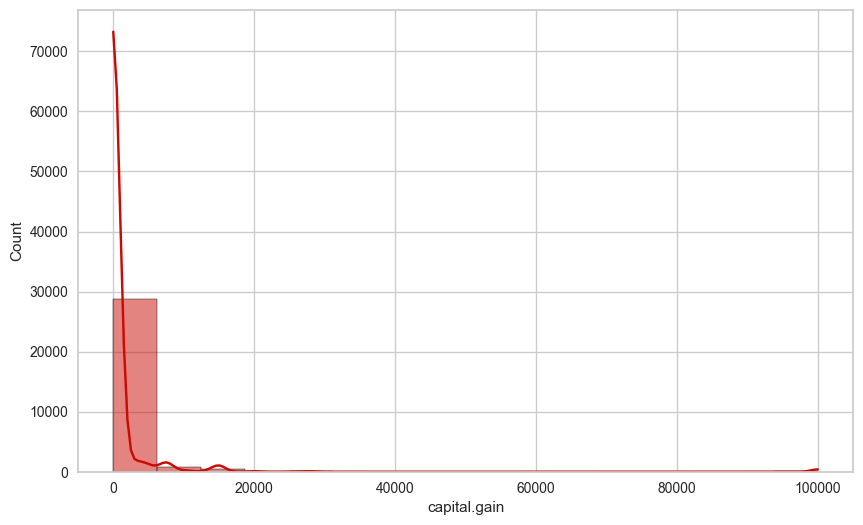

In [145]:
sns.histplot(df['capital.gain'], kde = True,color='r');

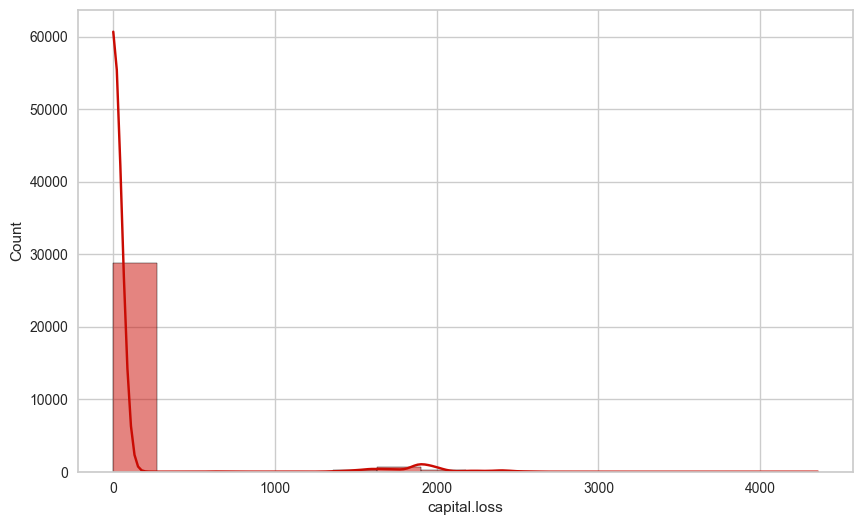

In [146]:
sns.histplot(df['capital.loss'], kde = True,color='r');

Both features 'capital.gain' and 'capital.loss' features have ~75% data as 0.00,. So, we can drop them as well.

In [147]:
df.drop(['capital.gain', 'capital.loss'], axis=1, inplace=True)

In [148]:
df

,age,workclass,fnlwgt,education,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income
1,82,Private,132870,HS-grad,Widowed,Exec-managerial,Not-in-family,White,Female,18,United-States,<=50K
3,54,Private,140359,7th-8th,Divorced,Machine-op-inspct,Unmarried,White,Female,40,United-States,<=50K
4,41,Private,264663,Some-college,Separated,Prof-specialty,Own-child,White,Female,40,United-States,<=50K
5,34,Private,216864,HS-grad,Divorced,Other-service,Unmarried,White,Female,45,United-States,<=50K
6,38,Private,150601,10th,Separated,Adm-clerical,Unmarried,White,Male,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,Some-college,Never-married,Protective-serv,Not-in-family,White,Male,40,United-States,<=50K
32557,27,Private,257302,Assoc-acdm,Married-civ-spouse,Tech-support,Wife,White,Female,38,United-States,<=50K
32558,40,Private,154374,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,40,United-States,>50K
32559,58,Private,151910,HS-grad,Widowed,Adm-clerical,Unmarried,White,Female,40,United-States,<=50K


In [149]:
# I will examine the value counts of the target feature to determine whether the dataset is balanced or imbalanced.

df.income.value_counts()

income
<=50K    22633
>50K      7506
Name: count, dtype: int64

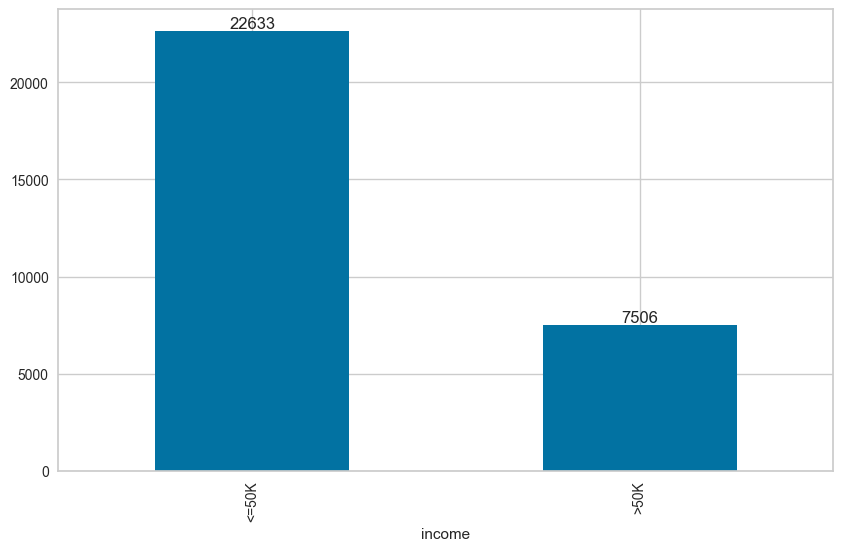

In [150]:
ax = df.income.value_counts().plot(kind ="bar")
ax.bar_label(ax.containers[0]); 

I have determined that my target feature is imbalanced, so I will proceed accordingly to address this imbalance.

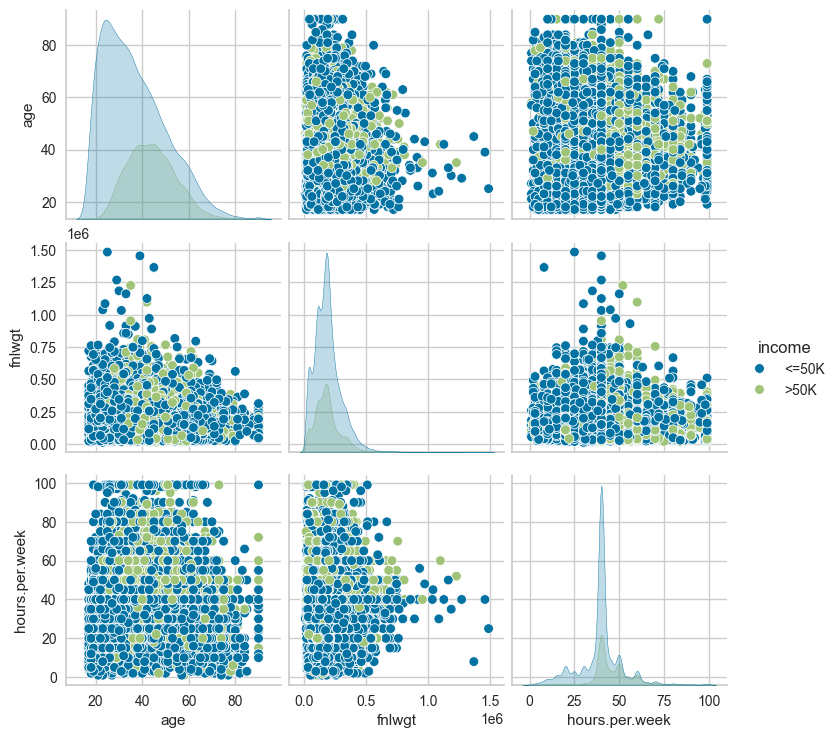

In [151]:
sns.pairplot(df, hue="income");

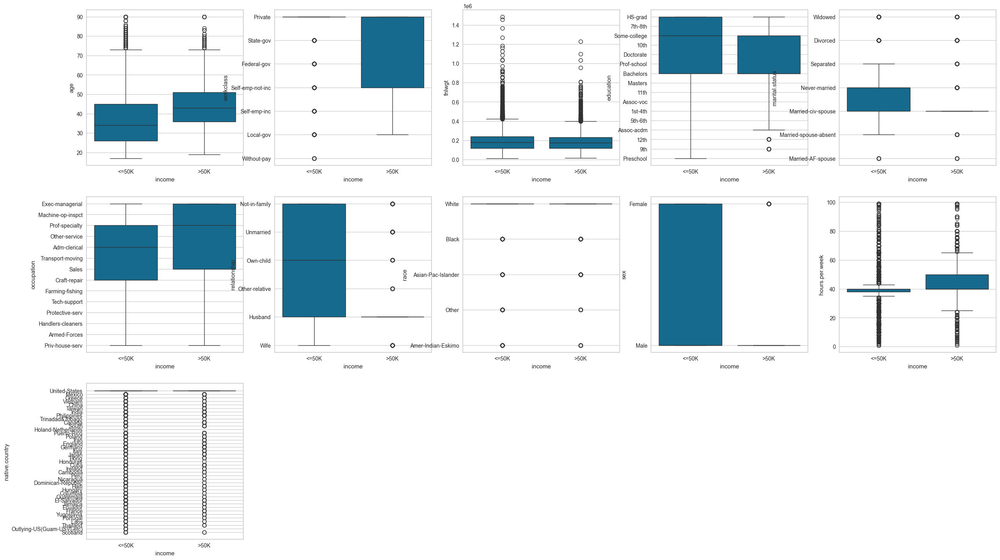

In [152]:
index = 0
plt.figure(figsize=(30,30))
# Exclude the target column 'income' from features
for feature in df.columns:
    if feature != "income":
        index += 1
        plt.subplot(5,5,index)
        sns.boxplot(x='income',y=feature,data=df)

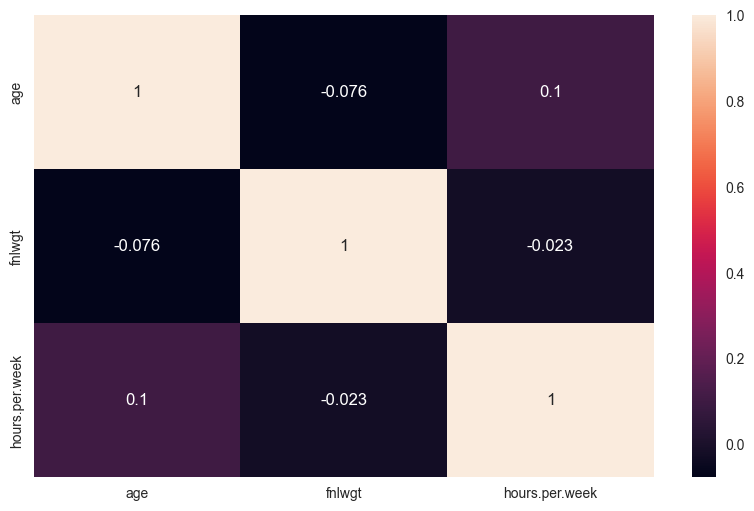

In [154]:
df_numeric = df.select_dtypes(include=[np.number])
sns.heatmap(df_numeric.corr(), annot=True);

In [155]:
cf.go_offline()
df.iloc[:,1:].iplot(kind="box")

# <font color='green'> <b>Data Pre-Processing</b><font color='black'>

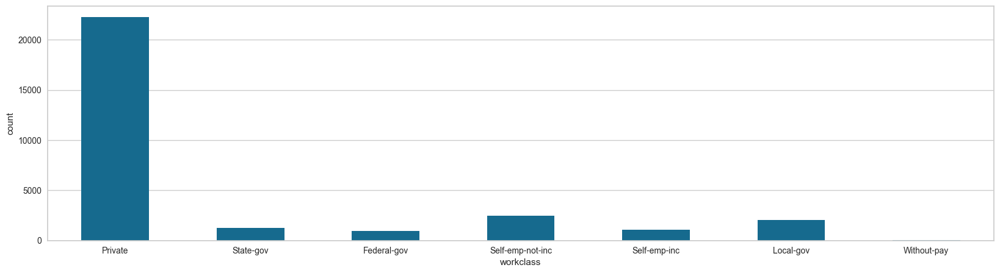

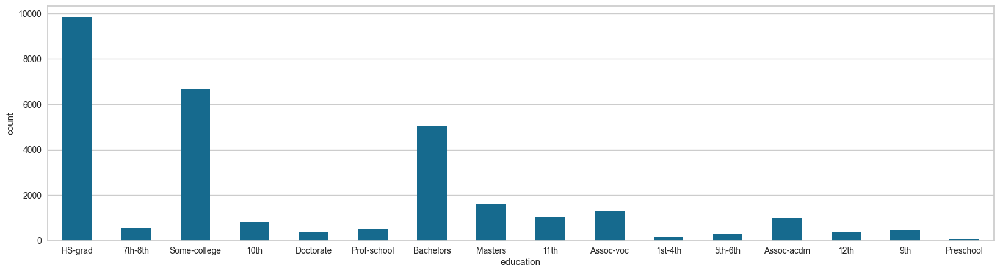

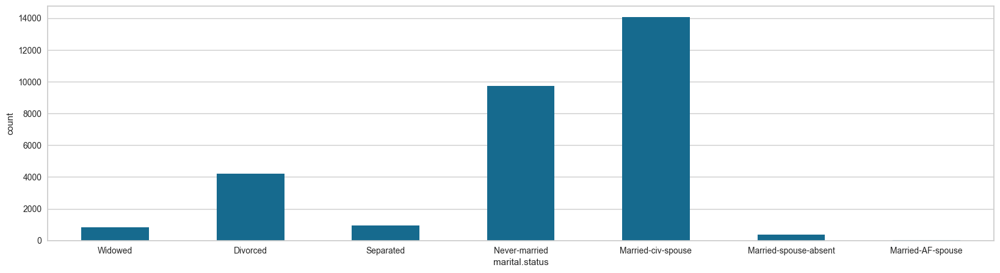

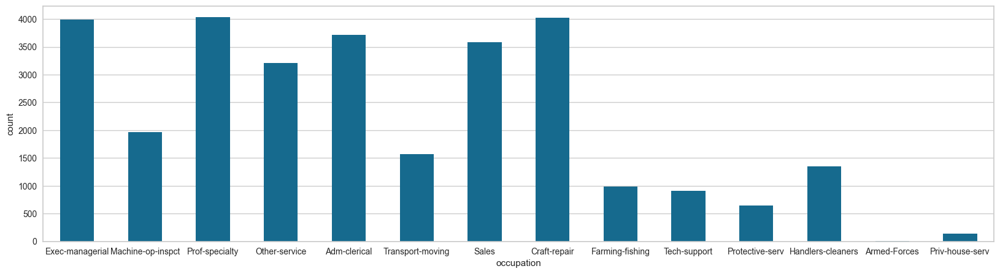

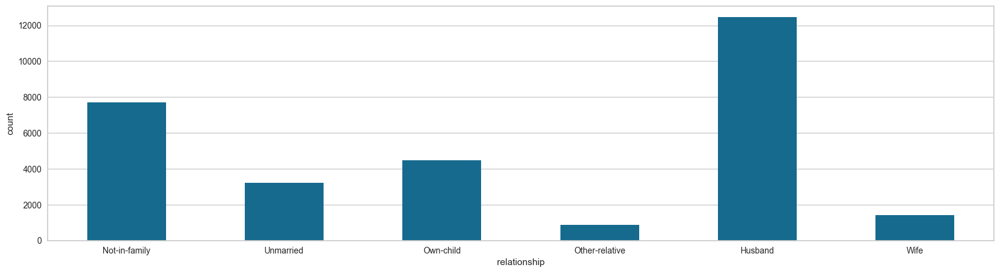

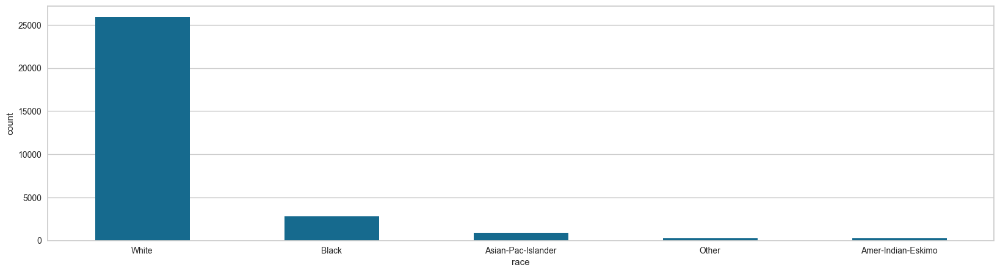

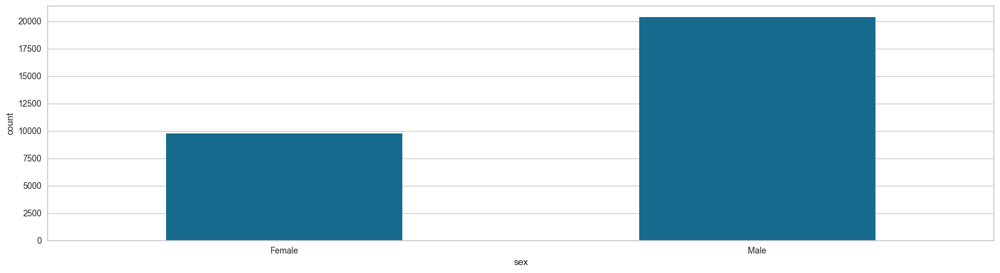

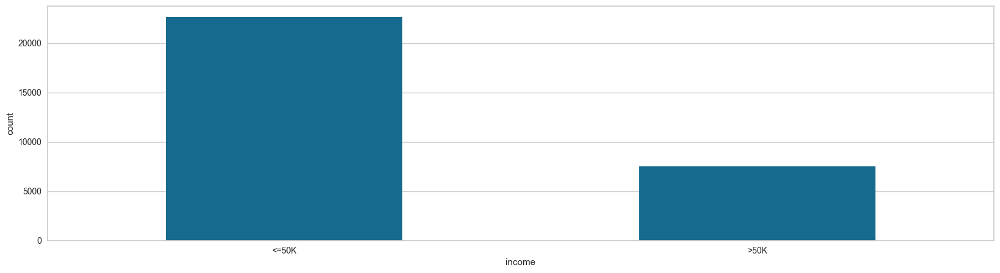

In [158]:
# Plotting for columns with values ​​less than 20
for col in df.columns:
  if len(df[col].unique()) <20 :
    plt.figure(figsize=(20,5))
    sns.countplot(x=col, data=df,width=0.5)
plt.show()

In [159]:
# Limit categorization
df['education'].replace('Preschool', 'dropout',inplace=True)
df['education'].replace('10th', 'dropout',inplace=True)
df['education'].replace('11th', 'dropout',inplace=True)
df['education'].replace('12th', 'dropout',inplace=True)
df['education'].replace('1st-4th', 'dropout',inplace=True)
df['education'].replace('5th-6th', 'dropout',inplace=True)
df['education'].replace('7th-8th', 'dropout',inplace=True)
df['education'].replace('9th', 'dropout',inplace=True)
df['education'].replace('HS-Grad', 'HighGrad',inplace=True)
df['education'].replace('HS-grad', 'HighGrad',inplace=True)
df['education'].replace('Some-college', 'CommunityCollege',inplace=True)
df['education'].replace('Assoc-acdm', 'CommunityCollege',inplace=True)
df['education'].replace('Assoc-voc', 'CommunityCollege',inplace=True)
df['education'].replace('Bachelors', 'Bachelors',inplace=True)
df['education'].replace('Masters', 'Masters',inplace=True)
df['education'].replace('Prof-school', 'Masters',inplace=True)
df['education'].replace('Doctorate', 'Doctorate',inplace=True)

In [161]:
# Limit categorization

df['marital.status'].replace('Never-married', 'NotMarried',inplace=True)
df['marital.status'].replace(['Married-AF-spouse'], 'Married',inplace=True)
df['marital.status'].replace(['Married-civ-spouse'], 'Married',inplace=True)
df['marital.status'].replace(['Married-spouse-absent'], 'NotMarried',inplace=True)
df['marital.status'].replace(['Separated'], 'Separated',inplace=True)
df['marital.status'].replace(['Divorced'], 'Separated',inplace=True)
df['marital.status'].replace(['Widowed'], 'Widowed',inplace=True)

In [162]:
df.duplicated().sum()

7

In [163]:
df.drop_duplicates(inplace=True)

In [ ]:
cat = df.select_dtypes("object").columns
cat

Index(['workclass', 'education', 'marital.status', 'occupation',
       'relationship', 'race', 'sex', 'native.country', 'income'],
      dtype='object')

In [ ]:
# Convert categorical features to numerical using LabelEncoder
from sklearn.preprocessing import LabelEncoder

enc = LabelEncoder()

In [164]:
df[cat] = df[cat].apply(enc.fit_transform)

In [165]:
df

,age,workclass,fnlwgt,education,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income
1,82,2,132870,3,3,3,1,4,0,18,38,0
3,54,2,140359,5,2,6,4,4,0,40,38,0
4,41,2,264663,1,2,9,3,4,0,40,38,0
5,34,2,216864,3,2,7,4,4,0,45,38,0
6,38,2,150601,5,2,0,4,4,1,40,38,0
...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,2,310152,1,1,10,1,4,1,40,38,0
32557,27,2,257302,1,0,12,5,4,0,38,38,0
32558,40,2,154374,3,0,6,0,4,1,40,38,1
32559,58,2,151910,3,3,0,4,4,0,40,38,0


# Modelling

In [170]:
#  Determine X and y
X = df.drop("income", axis=1)
y = df["income"]

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2,
                                                    stratify=y, 
                                                    random_state=42)

# Splitting the data into training and testing sets using the train_test_split function 
# to train the model and make predictions later.

# <font color='green'> <b>Implement Logistic Regression</b><font color='black'>

In [167]:
log_model = LogisticRegression()

In [172]:
operations = [("scaler", StandardScaler()), ("logistic", log_model)]

pipe_model = Pipeline(steps=operations)
pipe_model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression())])

In [174]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [175]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[4121  405]
 [ 912  589]]
              precision    recall  f1-score   support

           0       0.82      0.91      0.86      4526
           1       0.59      0.39      0.47      1501

    accuracy                           0.78      6027
   macro avg       0.71      0.65      0.67      6027
weighted avg       0.76      0.78      0.77      6027


Train_Set
[[16519  1581]
 [ 3641  2364]]
              precision    recall  f1-score   support

           0       0.82      0.91      0.86     18100
           1       0.60      0.39      0.48      6005

    accuracy                           0.78     24105
   macro avg       0.71      0.65      0.67     24105
weighted avg       0.76      0.78      0.77     24105



In [176]:
precision_macro = precision_score(y_test, y_pred, average='macro')
recall_macro = recall_score(y_test, y_pred, average='macro')
f1_macro = f1_score(y_test, y_pred, average='macro')

precision_micro = precision_score(y_test, y_pred, average='micro')
recall_micro = recall_score(y_test, y_pred, average='micro')
f1_micro = f1_score(y_test, y_pred, average='micro')

precision_weighted = precision_score(y_test, y_pred, average='weighted')
recall_weighted = recall_score(y_test, y_pred, average='weighted')
f1_weighted = f1_score(y_test, y_pred, average='weighted')

accuracy = accuracy_score(y_test, y_pred)

print("Macro Average Metrics")
print(f"Precision: {precision_macro:.3f}, Recall: {recall_macro:.3f}, F1-score: {f1_macro:.3f}")
print("---")
print("Micro Average Metrics")
print(f"Precision: {precision_micro:.3f}, Recall: {recall_micro:.3f}, F1-score: {f1_micro:.3f}")
print("---")
print("Weighted Average Metrics")
print(f"Precision: {precision_weighted:.3f}, Recall: {recall_weighted:.3f}, F1-score: {f1_weighted:.3f}")
print("---")
print(f"Accuracy: {accuracy:.3f}")

Macro Average Metrics
Precision: 0.706, Recall: 0.651, F1-score: 0.667
---
Micro Average Metrics
Precision: 0.781, Recall: 0.781, F1-score: 0.781
---
Weighted Average Metrics
Precision: 0.762, Recall: 0.781, F1-score: 0.765
---
Accuracy: 0.781


In [177]:
y_pred = pipe_model.predict(X_test)
y_pred
# Predicts which income value the test data belongs to.

array([0, 0, 0, ..., 0, 0, 1])

In [178]:
y_pred_proba = pipe_model.predict_proba(X_test)
y_pred_proba
# predict_proba shows the probability of each observation in the test data being assigned to a specific value.
# The first value represents the probability of belonging to <=50K(0), while the second value represents the probability of belonging to >50K(1).
# The class with the higher value is the one to which the observation is assigned.

array([[0.85991899, 0.14008101],
       [0.87784939, 0.12215061],
       [0.82651051, 0.17348949],
       ...,
       [0.94621969, 0.05378031],
       [0.92521163, 0.07478837],
       [0.28512185, 0.71487815]])

In [179]:
y_pred_proba_rounded = np.round(y_pred_proba, 2)
y_pred_proba_rounded

array([[0.86, 0.14],
       [0.88, 0.12],
       [0.83, 0.17],
       ...,
       [0.95, 0.05],
       [0.93, 0.07],
       [0.29, 0.71]])

In [180]:
test_data = pd.concat([X_test, y_test], axis=1)
test_data

,age,workclass,fnlwgt,education,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income
20998,25,4,191803,1,1,11,1,4,1,50,38,0
22607,53,0,186087,3,2,12,4,4,1,40,38,0
12042,20,2,50397,1,0,11,0,2,1,35,38,0
318,34,2,209297,3,1,6,1,2,1,40,38,0
22626,19,2,143360,3,1,6,3,4,0,34,38,0
...,...,...,...,...,...,...,...,...,...,...,...,...
21372,52,5,142757,3,0,10,0,2,1,40,38,1
31374,51,3,192973,0,0,10,0,2,1,40,38,1
4334,22,2,102632,3,1,2,1,4,1,41,38,0
17750,25,2,450246,3,1,2,3,4,1,40,38,0


In [181]:
test_data["pred"] = y_pred
test_data

# test_result aligns with pred_proba (predicted probability values) and pred values.
# While making predictions, the model assigns probabilities of 0.5 and greater to class 1, and probabilities less than 0.5 to class 0.
# Adding the model's predictions as the 'pred' feature to the test_data DataFrame

,age,workclass,fnlwgt,education,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income,pred
20998,25,4,191803,1,1,11,1,4,1,50,38,0,0
22607,53,0,186087,3,2,12,4,4,1,40,38,0,0
12042,20,2,50397,1,0,11,0,2,1,35,38,0,0
318,34,2,209297,3,1,6,1,2,1,40,38,0,0
22626,19,2,143360,3,1,6,3,4,0,34,38,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21372,52,5,142757,3,0,10,0,2,1,40,38,1,0
31374,51,3,192973,0,0,10,0,2,1,40,38,1,1
4334,22,2,102632,3,1,2,1,4,1,41,38,0,0
17750,25,2,450246,3,1,2,3,4,1,40,38,0,0


In [182]:
test_data["pred_proba_<=50K"] = y_pred_proba[:,0]
test_data["pred_proba_>50K"] = y_pred_proba[:,1]
test_data.sample(10)
# And we add the `pred_proba` column/feature to the `test_data` DataFrame, 
# showing the probabilities of belonging to class <=50K or >50K.

,age,workclass,fnlwgt,education,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income,pred,pred_proba_<=50K,pred_proba_>50K
3252,31,2,347166,1,2,2,3,4,1,40,38,0,0,0.951,0.049
18542,47,2,168262,0,1,0,3,4,1,40,38,0,0,0.700,0.300
914,27,2,34273,1,1,9,1,4,0,36,1,0,0,0.926,0.074
32502,18,2,436163,5,1,9,3,4,1,20,38,0,0,0.982,0.018
15028,57,2,279636,1,1,2,1,4,1,40,38,1,0,0.650,0.350
26479,49,2,206947,3,2,0,1,4,0,40,38,0,0,0.955,0.045
16397,44,2,134120,3,0,0,5,4,0,40,38,1,0,0.669,0.331
12630,41,1,74581,0,2,9,4,4,1,65,38,0,0,0.738,0.262
17636,46,1,160187,4,3,3,4,2,0,35,38,0,0,0.992,0.008
9553,38,2,110607,3,2,7,1,4,1,32,38,0,0,0.972,0.028


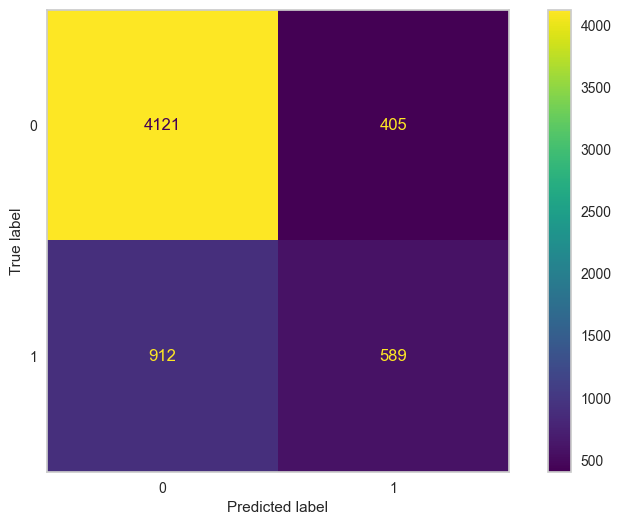

In [198]:
ConfusionMatrixDisplay.from_estimator(pipe_model, X_test, y_test)
plt.grid(False)
plt.show()

### Model Performance

In [183]:
accuracy_score(y_test, y_pred)
# Calculates the accuracy rate of the model. 
# Accuracy rate is the ratio of the model's correct predictions to all predictions.

0.781483325037332

In [184]:
precision_score(y_test, y_pred, pos_label=1) # default = pos_label=1
# It shows how many of the predictions for class 1 are correct.
# A precision of 0.1 means the model correctly predicted 10% of its predictions.

0.5925553319919518

In [185]:
precision_score(y_test, y_pred, pos_label=0)

0.8187959467514405

In [186]:
recall_score(y_test, y_pred, pos_label=1)

# By default, it returns the recall_score for class 1.
# It shows how many of the actual positives for class 1 the model correctly predicted.

0.3924050632911392

In [187]:
recall_score(y_test, y_pred, pos_label=0)
# For the score of the 0, pos_label=0 should be set.

0.9105170128148475

In [188]:
f1_score(y_test, y_pred, pos_label=1)

0.4721442885771543

In [189]:
f1_score(y_test, y_pred, pos_label=0)

0.8622240820169473

In [190]:
log_loss(y_test, y_pred)
# log_loss measures how much the predicted probabilities deviate from the actual values.
# The lower the log_loss value, the higher the accuracy of the model's predictions.
# A high log_loss value indicates that the model's predictions are far from the actual values.

7.87613929209678

### Cross Validate

In [191]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

# To make a definitive decision on overfitting/underfitting via cross-validation, set
# return_train_score=True 
# to compare both train and validation set scores in each iteration.

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
1,0.173,0.071,0.782,0.784,0.600,0.601,0.379,0.391,0.465,0.474
2,0.045,0.017,0.787,0.783,0.608,0.599,0.413,0.391,0.492,0.473
3,0.043,0.034,0.783,0.784,0.594,0.601,0.409,0.395,0.485,0.477
4,0.051,0.021,0.782,0.785,0.604,0.602,0.366,0.398,0.456,0.479
5,0.040,0.018,0.789,0.782,0.611,0.597,0.426,0.388,0.502,0.470
6,0.048,0.022,0.776,0.786,0.584,0.605,0.352,0.402,0.439,0.483
7,0.044,0.016,0.785,0.783,0.606,0.599,0.395,0.390,0.478,0.472
8,0.045,0.016,0.776,0.784,0.576,0.602,0.387,0.396,0.463,0.478
9,0.046,0.020,0.789,0.784,0.615,0.599,0.407,0.397,0.489,0.478
10,0.067,0.032,0.780,0.782,0.586,0.596,0.398,0.393,0.474,0.474


In [192]:
df_scores.mean()[2:]

test_accuracy     0.783
train_accuracy    0.784
test_precision    0.598
train_precision   0.600
test_recall       0.393
train_recall      0.394
test_f1           0.474
train_f1          0.476
dtype: float64

### GridSearch

In [193]:
# pipeline for logistic regression
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression(max_iter=5000))]

model = Pipeline(steps=operations)

In [194]:
# Define the hyperparameter grid
penalty = ["l1", "l2"]  # l1: Lasso, l2: Ridge
C = np.logspace(-1, 5, 20)  # Regularization strength values

param_grid = [
    {
        "logistic__penalty": ["l1"],
        "logistic__C": C,
        "logistic__solver": ["liblinear", "saga"]
    },
    {
        "logistic__penalty": ["l2"],
        "logistic__C": C,
        "logistic__solver": ["newton-cg", "lbfgs", "liblinear", "sag", "saga"]
    },
    {
        "logistic__penalty": ["elasticnet"],
        "logistic__C": C,
        "logistic__solver": ["saga"],
        "logistic__l1_ratio": np.linspace(0, 1, 10)  #  Adding l1_ratio for ElasticNet
    },
    {
        "logistic__penalty": ["none"],
        "logistic__solver": ["newton-cg", "lbfgs", "sag", "saga"]
    }
]

In [ ]:
grid_model = GridSearchCV(estimator=model, 
                          param_grid=param_grid, 
                          cv = 5,
                          scoring='recall',
                          return_train_score=True)

grid_model.fit(X_train, y_train)

ValueError: Invalid parameter 'logistic' for estimator GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic',
                                        LogisticRegression(max_iter=5000))]),
             param_grid=[{'logistic__C': array([1.00000000e-01, 2.06913808e-01, 4.28133240e-01, 8.85866790e-01,
       1.83298071e+00, 3.79269019e+00, 7.84759970e+00, 1.62377674e+01,
       3.35981829e+01, 6.95192796e+01, 1.43844989e+02, 2.97635144e+02,
       6.15848211e+02,...
       1.12883789e+04, 2.33572147e+04, 4.83293024e+04, 1.00000000e+05]),
                          'logistic__l1_ratio': array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ]),
                          'logistic__penalty': ['elasticnet'],
                          'logistic__solver': ['saga']},
                         {'logistic__penalty': ['none'],
                          'logistic__solver': ['newton-cg', 'lbfgs', 'sag',
                                               'saga']}],
             return_train_score=True, scoring='accuracy'). Valid parameters are: ['cv', 'error_score', 'estimator', 'n_jobs', 'param_grid', 'pre_dispatch', 'refit', 'return_train_score', 'scoring', 'verbose'].

In [196]:
y_pred = grid_model.predict(X_test)

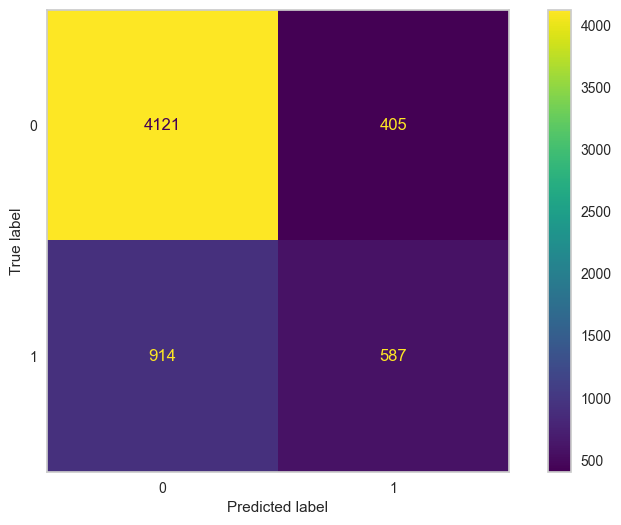

In [200]:
y_pred = ConfusionMatrixDisplay.from_estimator(grid_model, X_test, y_test)
plt.grid(False)
plt.show()

In [201]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[4121  405]
 [ 912  589]]
              precision    recall  f1-score   support

           0       0.82      0.91      0.86      4526
           1       0.59      0.39      0.47      1501

    accuracy                           0.78      6027
   macro avg       0.71      0.65      0.67      6027
weighted avg       0.76      0.78      0.77      6027


Train_Set
[[16519  1581]
 [ 3641  2364]]
              precision    recall  f1-score   support

           0       0.82      0.91      0.86     18100
           1       0.60      0.39      0.48      6005

    accuracy                           0.78     24105
   macro avg       0.71      0.65      0.67     24105
weighted avg       0.76      0.78      0.77     24105



### Precision-Recall Curve & ROC (Receiver Operating Curve) and AUC (Area Under Curve)

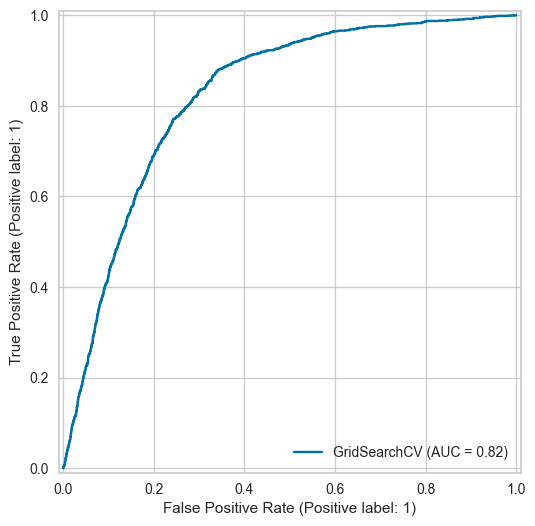

In [ ]:
RocCurveDisplay.from_estimator(grid_model, X_test, y_test)
plt.show()
# Model is 82% successful in distinguishing the 0 and 1

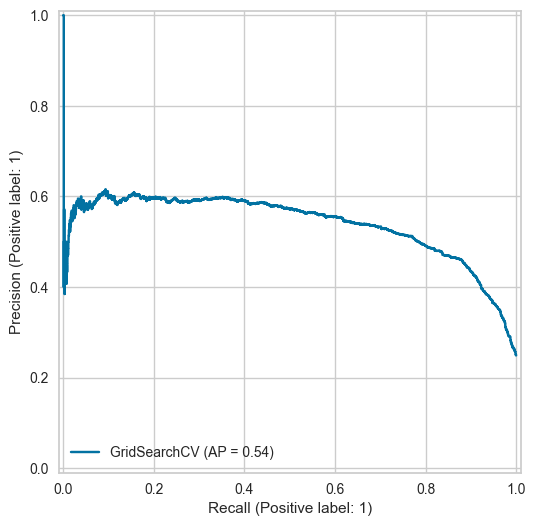

In [203]:
PrecisionRecallDisplay.from_estimator(grid_model, X_test,y_test)
plt.show()

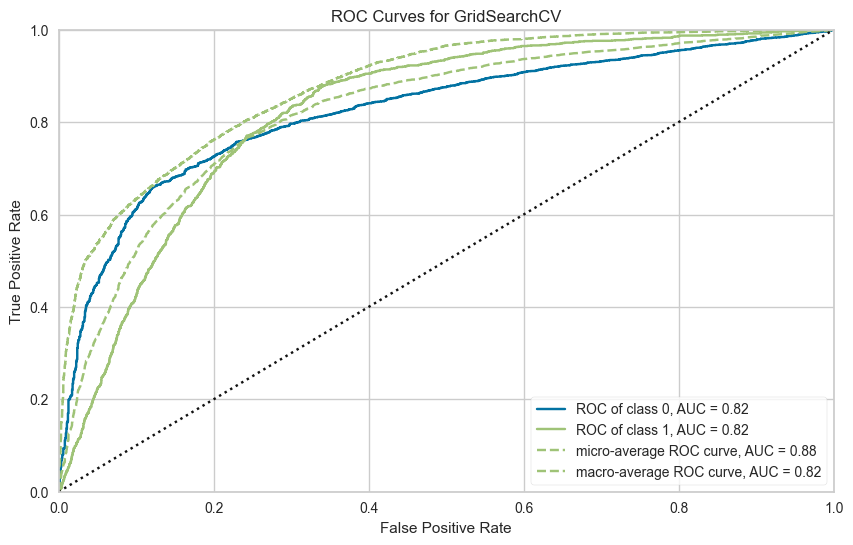

In [204]:
model = grid_model
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show();

In [205]:
average_precision_score(y_test,y_pred_proba[:,1])

0.5391545709452387

# <font color='green'> <b>K Nearest Neigbors (KNN)</b><font color='black'>

In [207]:
knn = KNeighborsClassifier()

In [209]:
operations = [("scaler", StandardScaler()), ("knn", knn)]

pipe_model = Pipeline(steps = operations)

pipe_model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [211]:
# Make predictions
y_pred = pipe_model.predict(X_test)
y_pred_proba = pipe_model.predict_proba(X_test)

In [212]:
pd.DataFrame(y_pred_proba)

,0,1
0,0.800,0.200
1,0.400,0.600
2,1.000,0.000
3,1.000,0.000
4,1.000,0.000
...,...,...
6022,0.600,0.400
6023,0.200,0.800
6024,1.000,0.000
6025,1.000,0.000


In [213]:
my_dict = {"Actual": y_test, "Pred":y_pred, "Proba_1":y_pred_proba[:,1], "Proba_0":y_pred_proba[:,0]}
pd.DataFrame(my_dict).sample(10)

,Actual,Pred,Proba_1,Proba_0
28336,0,0,0.000,1.000
17729,0,0,0.200,0.800
4584,0,0,0.000,1.000
9879,0,0,0.000,1.000
2969,1,1,1.000,0.000
9420,0,0,0.000,1.000
31497,1,0,0.200,0.800
5334,0,0,0.000,1.000
5110,1,1,0.600,0.400
11377,0,0,0.000,1.000


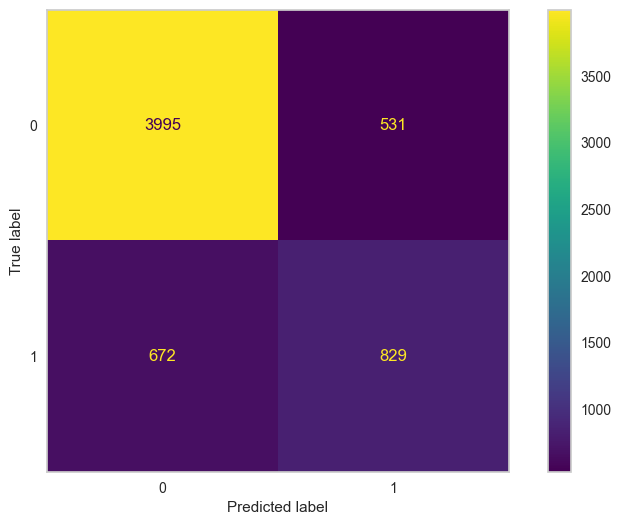

In [215]:
ConfusionMatrixDisplay.from_estimator(pipe_model, X_test, y_test)
plt.grid(False);

In [216]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [217]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[3995  531]
 [ 672  829]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      4526
           1       0.61      0.55      0.58      1501

    accuracy                           0.80      6027
   macro avg       0.73      0.72      0.72      6027
weighted avg       0.79      0.80      0.80      6027


Train_Set
[[16729  1371]
 [ 2034  3971]]
              precision    recall  f1-score   support

           0       0.89      0.92      0.91     18100
           1       0.74      0.66      0.70      6005

    accuracy                           0.86     24105
   macro avg       0.82      0.79      0.80     24105
weighted avg       0.85      0.86      0.86     24105



In [230]:
from sklearn.metrics import make_scorer

#### Choosing Reasonable K Values

In [233]:
# Calculate the mean recall score
scoring = {'recall': make_scorer(recall_score, average='macro')}
test_error_rates = []
for k in range(1,30):
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring=scoring, cv=5)
    recall_mean = scores["test_recall"].mean()
    test_error = 1 - recall_mean
    test_error_rates.append(test_error)

# To select the optimal K value:
# - If the dataset is balanced, we use accuracy.
# - If the dataset is unbalanced, we focus on the recall metric for the target class.
# For each K value (ranging from 1 to 30), we first calculate the accuracy score and then subtract it from 1 to obtain the error score for each K.
# Since finding the optimal K value using the test dataset (hold-out set) might lead to data leakage,
# we use the train dataset in cross-validation (CV) and base our decision on the average error scores across the validation sets.

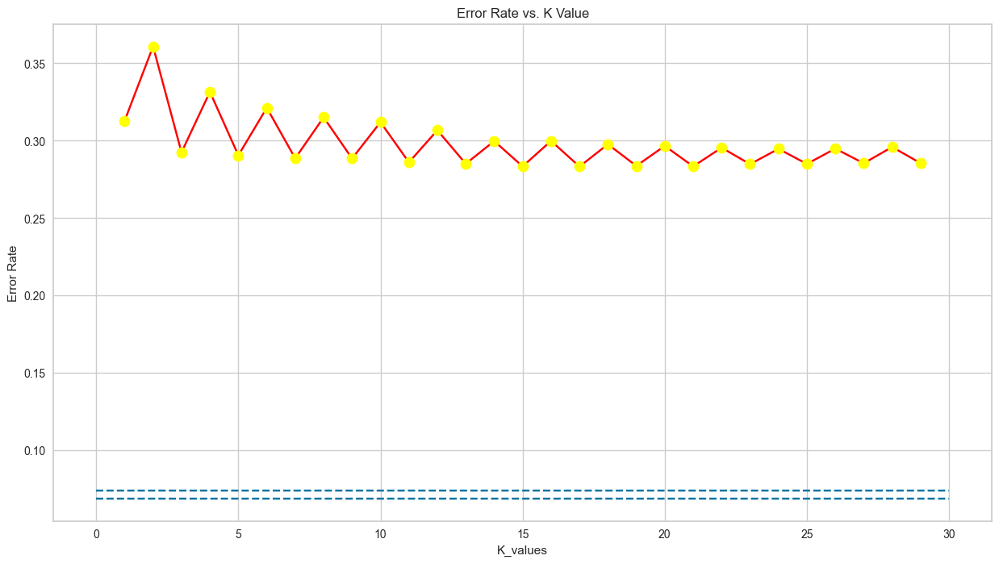

In [ ]:
plt.figure(figsize=(15, 8))
plt.plot(range(1, 30),
         test_error_rates,
         color='red',
         marker='o',
         markerfacecolor='yellow',
         markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.074, xmin=0, xmax=30, colors='b', linestyles="--")
plt.hlines(y=0.069, xmin=0, xmax=30, colors='b', linestyles="--")
plt.show()
# Visualize the error scores that we calculated.

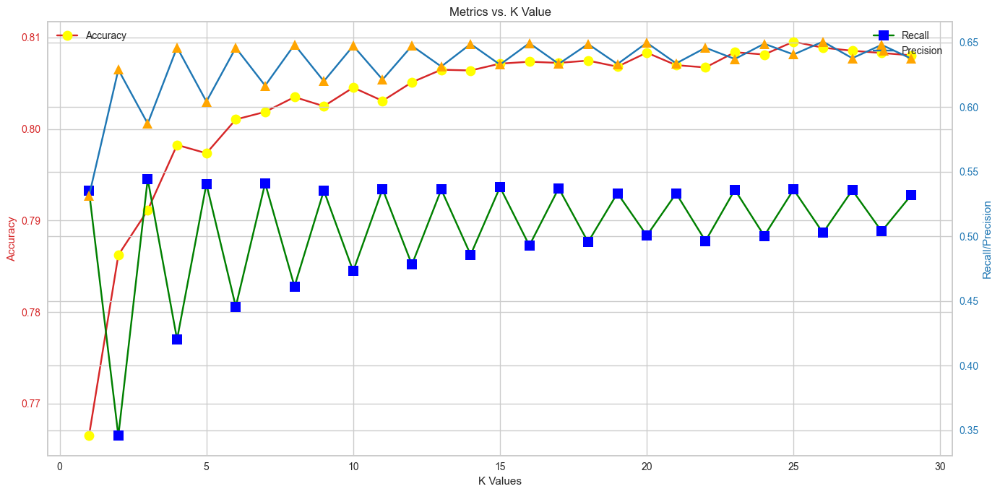

In [235]:
from sklearn.metrics import make_scorer

accuracy_scores = []
recall_scores = []
precision_scores = []

for k in range(1, 30):
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'recall': make_scorer(recall_score),
        'precision': make_scorer(precision_score)
    }
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring=scoring, cv=10)
    
    accuracy_mean = scores["test_accuracy"].mean()
    recall_mean = scores["test_recall"].mean()
    precision_mean = scores["test_precision"].mean()
    
    accuracy_scores.append(accuracy_mean)
    recall_scores.append(recall_mean)
    precision_scores.append(precision_mean)

fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'tab:red'
ax1.set_xlabel('K Values')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(range(1, 30), accuracy_scores, color=color, marker='o', markerfacecolor='yellow', markersize=10, label='Accuracy')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Recall/Precision', color=color)
ax2.plot(range(1, 30), recall_scores, color='green', marker='s', markerfacecolor='blue', markersize=10, label='Recall')
ax2.plot(range(1, 30), precision_scores, color=color, marker='^', markerfacecolor='orange', markersize=10, label='Precision')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

plt.title('Metrics vs. K Value')
fig.tight_layout()
plt.show()

#### Overfiting and underfiting control for k values

In [236]:
test_error_rates = []
train_error_rates = []


for k in range(1,30):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]

    knn_pipe_model = Pipeline(steps=operations)
    
    knn_pipe_model.fit(X_train,y_train) 
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 10, return_train_score=True)
    
    recall_test_mean = scores["test_recall"].mean() 
    recall_train_mean = scores["train_recall"].mean() 

    
    test_error = 1 - recall_test_mean
    train_error = 1 - recall_train_mean
    test_error_rates.append(test_error)
    train_error_rates.append(train_error)

# Repeat the same process as above using the train data provided in cross-validation (CV) and 
# compare the average error scores of the validation and train datasets.
# This allows us to more easily detect any overfitting.

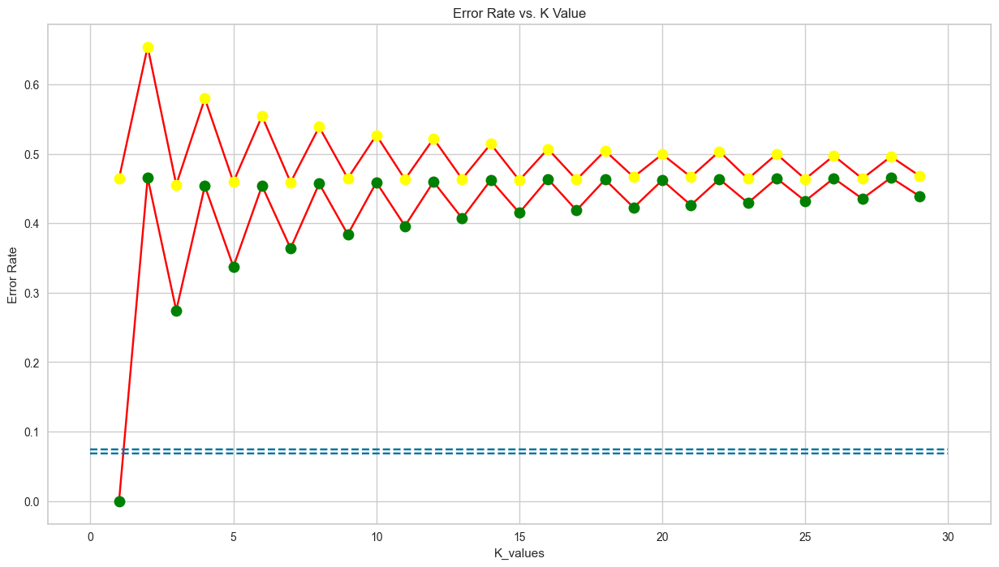

In [237]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='red', marker='o',
         markerfacecolor='yellow', markersize=10)

plt.plot(range(1,30), train_error_rates, color='red', marker='o',
         markerfacecolor='green', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.074, xmin = 0, xmax = 30, colors= 'b', linestyles="--")
plt.hlines(y=0.069, xmin = 0, xmax = 30, colors= 'b', linestyles="--")
plt.show()

# The yellow bars represent scores for the validation data, while the green bars represent scores for the train data.
# For the validation data, the lowest error score is achieved at K=21. However, if we choose K=21,
# the model's complexity and computational cost will significantly increase.
# For K=9, the error score is 0.074, whereas for K=21, it is 0.069.
# Is a difference of 0.005 worth the additional complexity and computational cost? This is something we should carefully consider.
# For such a small difference, it is not worth incurring the extra cost.
# At K=21, the error scores for both validation and train datasets are almost identical.
# However, at K=9, the error score for the validation data is 0.074, while for the train data it is 0.060.
# The difference is 0.014, which is very small, making K=9 a reasonable and cost-effective choice.

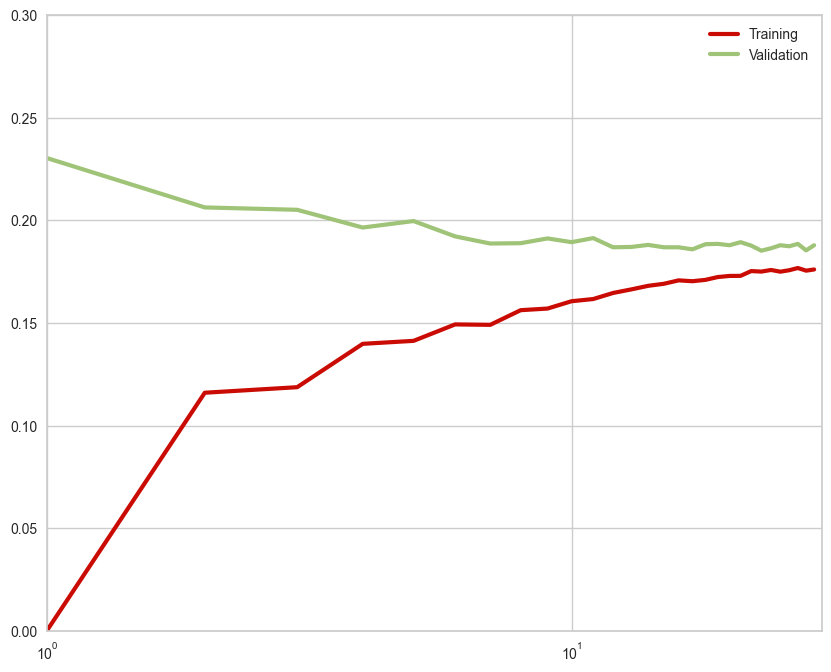

In [238]:
# Define the range of K values to evaluate.
K = range(1, 30)

# Lists to store training and validation error scores.
train_error_rates = []
test_error_rates = []

# Running the KNN model for different K values.
for k in K:
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    
    knn_pipe_model.fit(X_train, y_train)
    
    train_pred = knn_pipe_model.predict(X_train)
    test_pred = knn_pipe_model.predict(X_test)
    
    train_error = 1 - accuracy_score(y_train, train_pred)
    test_error = 1 - accuracy_score(y_test, test_pred)
    
    train_error_rates.append(train_error)
    test_error_rates.append(test_error)

# Calculate the training and validation error scores.
train_err = train_error_rates
val_err = test_error_rates

# Creating a graph to visualize the training and validation error scores for different K values.
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Plotting the training and validation error scores to analyze their behavior across different K values.
ax.semilogx(K, train_err, 'r-', lw=3, label='Training')
ax.semilogx(K, val_err, 'g-', lw=3, label='Validation')

ax.legend()

ax.set_xlim(1, 30)
ax.set_ylim(0, 0.3)  
plt.show()

In [239]:
k_list = [3, 6, 9, 16, 21, 22, 23]
 
for i in k_list:
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=i))]
    knn = Pipeline(steps=operations)
    knn.fit(X_train, y_train)
    print(f'WITH K={i}\n')
    eval_metric(knn, X_train, y_train, X_test, y_test)

WITH K=3

Test_Set
[[3949  577]
 [ 659  842]]
              precision    recall  f1-score   support

           0       0.86      0.87      0.86      4526
           1       0.59      0.56      0.58      1501

    accuracy                           0.79      6027
   macro avg       0.73      0.72      0.72      6027
weighted avg       0.79      0.79      0.79      6027


Train_Set
[[16886  1214]
 [ 1647  4358]]
              precision    recall  f1-score   support

           0       0.91      0.93      0.92     18100
           1       0.78      0.73      0.75      6005

    accuracy                           0.88     24105
   macro avg       0.85      0.83      0.84     24105
weighted avg       0.88      0.88      0.88     24105

WITH K=6

Test_Set
[[4175  351]
 [ 807  694]]
              precision    recall  f1-score   support

           0       0.84      0.92      0.88      4526
           1       0.66      0.46      0.55      1501

    accuracy                           0.81     

#### Cross Validate For Optimal K Value

In [241]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=9))]
model = Pipeline(steps=operations)
scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_accuracy     0.800
train_accuracy    0.841
test_precision    0.615
train_precision   0.709
test_recall       0.534
train_recall      0.614
test_f1           0.572
train_f1          0.658
dtype: float64

#### Gridsearch Method for Choosing Reasonable K Values

In [243]:
import mglearn

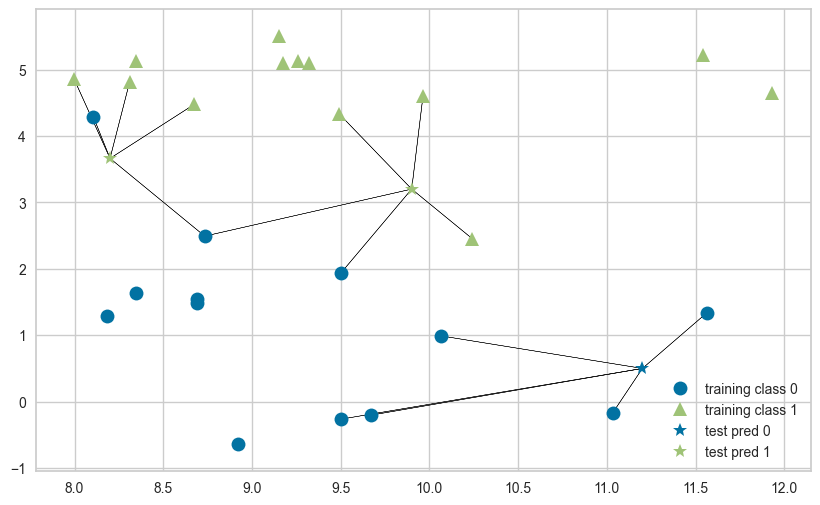

In [244]:
mglearn.plots.plot_knn_classification(n_neighbors=5);

In [245]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]
knn_model = Pipeline(steps=operations)

In [246]:
param_grid = [
    {
        "knn__n_neighbors": range(1, 30),
        "knn__metric": ['euclidean', 'manhattan'],
        "knn__weights": ['uniform', 'distance']
    },
    {
        "knn__n_neighbors": range(1, 30),
        "knn__metric": ['minkowski'],
        "knn__p": [1, 2],
        "knn__weights": ['uniform', 'distance']
    }
]

In [247]:
knn_grid_model = GridSearchCV(knn_model, param_grid, cv=5, scoring= "recall", return_train_score=True)
knn_grid_model.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             param_grid=[{'knn__metric': ['euclidean', 'manhattan'],
                          'knn__n_neighbors': range(1, 30),
                          'knn__weights': ['uniform', 'distance']},
                         {'knn__metric': ['minkowski'],
                          'knn__n_neighbors': range(1, 30), 'knn__p': [1, 2],
                          'knn__weights': ['uniform', 'distance']}],
             return_train_score=True, scoring='recall')

In [248]:
eval_metric(knn_grid_model,X_train, y_train, X_test, y_test )

Test_Set
[[4097  429]
 [ 638  863]]
              precision    recall  f1-score   support

           0       0.87      0.91      0.88      4526
           1       0.67      0.57      0.62      1501

    accuracy                           0.82      6027
   macro avg       0.77      0.74      0.75      6027
weighted avg       0.82      0.82      0.82      6027


Train_Set
[[18100     0]
 [    2  6003]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     18100
           1       1.00      1.00      1.00      6005

    accuracy                           1.00     24105
   macro avg       1.00      1.00      1.00     24105
weighted avg       1.00      1.00      1.00     24105



#### Evaluating ROC Curves and AUC

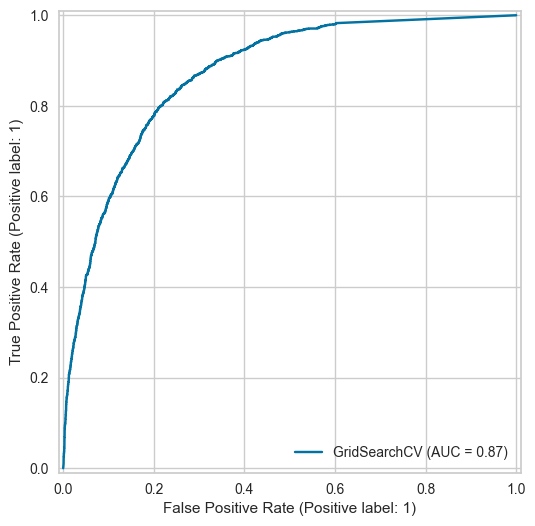

In [249]:
RocCurveDisplay.from_estimator(knn_grid_model, X_test, y_test);

In [251]:
y_pred_proba = knn_grid_model.predict_proba(X_test)
roc_auc_score(y_test, y_pred_proba[:,1])

0.8693804954893822

# <font color='green'> <b>Implement Support Vector Machine (SVC)</b><font color='black'>

In [258]:
model = SVC
operations = [("scaler", StandardScaler()), ("SVC", SVC())]

pipe_model = Pipeline(steps=operations)

pipe_model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('SVC', SVC())])

In [259]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[4107  419]
 [ 709  792]]
              precision    recall  f1-score   support

           0       0.85      0.91      0.88      4526
           1       0.65      0.53      0.58      1501

    accuracy                           0.81      6027
   macro avg       0.75      0.72      0.73      6027
weighted avg       0.80      0.81      0.81      6027


Train_Set
[[16513  1587]
 [ 2799  3206]]
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     18100
           1       0.67      0.53      0.59      6005

    accuracy                           0.82     24105
   macro avg       0.76      0.72      0.74     24105
weighted avg       0.81      0.82      0.81     24105



In [261]:
# Cross Validate
scores = cross_validate(pipe_model,
                        X_train,
                        y_train,
                        scoring=['accuracy', 'precision', 'recall', 'f1'],
                        cv=5,
                        return_train_score=True)

df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]
# We check for overfitting here.

test_accuracy     0.807
train_accuracy    0.818
test_precision    0.644
train_precision   0.671
test_recall       0.505
train_recall      0.533
test_f1           0.566
train_f1          0.594
dtype: float64

#### GridSearch

In [ ]:
param_grid = {'SVC__C': [0.01, 0.1, 1, 10, 100],
              'SVC__gamma': ["scale", "auto", 0.2, 0.3, 0.5],
              'SVC__kernel': ['rbf', 'linear'],
              'SVC__class_weight': ["unbalanced", None]}

# Defining hyperparameter space.

In [265]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(probability=True))]
pipe_model = Pipeline(steps=operations)
svm_model_grid = GridSearchCV(pipe_model,
                              param_grid,
                              scoring="recall",
                              cv=5, 
                              return_train_score=True,
                              n_jobs=1)
# SVC does not perform predictions via predict_proba. Predictions are made using the decision_function.
# If we want to obtain predict_proba, we need to set the probability hyperparameter to True for SVC.
# When probability=True is used, the training process becomes slower.

In [ ]:
svm_model_grid.fit(X_train, y_train)

In [ ]:
eval_metric(svm_model_grid, X_train, y_train, X_test, y_test)

In [ ]:
decision_function = svm_model_grid.decision_function(X_test)
decision_function

# SVC makes predictions using the decision_function.
# Positive values represent class 1, while negative values represent class 0.
# The larger the value, the farther the observation is from the hyperplane.

In [ ]:
svm_model_grid.predict(X_test)

In [ ]:
PrecisionRecallDisplay.from_estimator(svm_model_grid, X_test, y_test)

In [ ]:
average_precision_score(y_test, decision_function)

In [ ]:
from sklearn.datasets import make_blobs

# Creating the sample data and ensuring some points are misclassified
X, y = make_blobs(n_samples=300, centers=2, random_state=42, cluster_std=1.0)
y[::10] = 1 - y[::10]  # Changing the class of every 10th sample to create misclassifications

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and training the SVM model
model = svm.SVC(kernel='linear', C=1.0)
model.fit(X_train, y_train)

# Plotting the graph
def plot_svm_decision_boundary_with_errors(model, X_train, y_train, X_test, y_test):
    # Creating the graph
    plt.figure(figsize=(10, 6))

    # Plotting the training data
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='bwr', s=30, edgecolors='k', label='Train')
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='coolwarm', s=30, edgecolors='k', label='Test')

    # Plotting the support vectors
    plt.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100, facecolors='none', edgecolors='k', label='Support Vectors')

    # Plotting the decision boundary and margins
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Creating meshgrid for the decision boundary
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T
    Z = model.decision_function(xy).reshape(XX.shape)

    # Plotting the decision boundary and margins
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

    # Identifying and plotting misclassified points
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    misclassified_train = (y_train != y_train_pred)
    misclassified_test = (y_test != y_test_pred)

    plt.scatter(X_train[misclassified_train, 0], X_train[misclassified_train, 1], facecolors='none', edgecolors='r', s=100, label='Misclassified Train')
    plt.scatter(X_test[misclassified_test, 0], X_test[misclassified_test, 1], facecolors='none', edgecolors='y', s=100, label='Misclassified Test')

    # Displaying the graph
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('SVM Decision Boundary with Misclassified Points')
    plt.legend()
    plt.show()

# Calling the graph function
plot_svm_decision_boundary_with_errors(model, X_train, y_train, X_test, y_test)

# <font color='green'> <b>Conclusion</b><font color='black'>